In [126]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import contextily as cx
import shapely.geometry as sg
import seaborn as sns
import ast
import folium
import os
from tqdm import tqdm

%config InlineBackend.figure_format='retina'

In [127]:
# load one quay wall from file
df_sat_ver1 = pd.read_csv('../Data/export_vertical_quays_julian.csv')
df_sat_ver1 = df_sat_ver1[df_sat_ver1['raknr'] == 'KZG0301'].rename(columns={'raknr':'objectnumm'})

# load other quay walls from file and add the one
df_sat_ver2 = pd.read_csv('../Data/SatelliteData/export_vertical_quays_julian.csv')
df_sat_ver = pd.concat((df_sat_ver2, df_sat_ver1), axis=0)

In [128]:
# load one quay wall from file
df_sat_hor1 = pd.read_csv('../Data/export_horizontal_quays_julian.csv')
df_sat_hor1 = df_sat_hor1[df_sat_hor1['raknr'] == 'KZG0301'].rename(columns={'raknr':'objectnumm'})

# load other quay walls from file and add the one
df_sat_hor2 = pd.read_csv('../Data/SatelliteData/export_horizontal_quays_julian.csv')
df_sat_hor = pd.concat((df_sat_hor2, df_sat_hor1), axis=0)

In [129]:
# load one quay wall from file
df_sat_ach1 = pd.read_csv('../Data/export_hinterland_julian.csv')
df_sat_ach1 = df_sat_ach1[df_sat_ach1['raknr'] == 'KZG0301'].rename(columns={'raknr':'objectnumm'})

# load other quay walls from file and add the one
df_sat_ach2 = pd.read_csv('../Data/SatelliteData/export_hinterland_julian.csv')
df_sat_ach = pd.concat((df_sat_ach2, df_sat_ach1), axis=0)

In [130]:
# drop unused columns
df_sat_ver = df_sat_ver.drop(['azimuth_dir', 'perp_azimuth_dir', 'const', 'const_acc', 'coverage', 'coverage_quality', \
                 'decomp_acc_hor', 'decomp_acc_ver', 'decomp_rmse', 'decomp_rmse_hor_ratio', 'decomp_rmse_ver_ratio', \
                 'height_wrt_dem', 'mean_spatial_quality', 'n_hits_asc_t116_ods_siblings_l2a_5239e1cf', \
                 'n_hits_asc_t116_ps_l2a_5b2eea40', 'n_hits_dsc_t139_ods_siblings_l2a_9dd22e61', \
                 'n_hits_dsc_t139_ps_l2a_30b9b737', 'n_stacks', 'quadratic', 'quadratic_acc', 'rmse', 'seasonal_amplitude', \
                 'seasonal_cos', 'seasonal_cos_acc', 'seasonal_phase', 'seasonal_sin', 'seasonal_sin_acc', \
                 'sensitivity_hor', 'sensitivity_ver', 'total_hits', 'velocity', 'velocity_acc'], axis=1)

# drop unused columns
df_sat_hor = df_sat_hor.drop(['azimuth_dir', 'perp_azimuth_dir', 'const', 'const_acc', 'coverage', 'coverage_quality', \
                 'decomp_acc_hor', 'decomp_acc_ver', 'decomp_rmse', 'decomp_rmse_hor_ratio', 'decomp_rmse_ver_ratio', \
                 'height_wrt_dem', 'mean_spatial_quality', 'n_hits_asc_t116_ods_siblings_l2a_5239e1cf', \
                 'n_hits_asc_t116_ps_l2a_5b2eea40', 'n_hits_dsc_t139_ods_siblings_l2a_9dd22e61', \
                 'n_hits_dsc_t139_ps_l2a_30b9b737', 'n_stacks', 'quadratic', 'quadratic_acc', 'rmse', 'seasonal_amplitude', \
                 'seasonal_cos', 'seasonal_cos_acc', 'seasonal_phase', 'seasonal_sin', 'seasonal_sin_acc', \
                 'sensitivity_hor', 'sensitivity_ver', 'total_hits', 'velocity', 'velocity_acc'], axis=1)

# drop unused columns
df_sat_ach = df_sat_ach.drop(['const', 'const_acc', 'coverage', 'coverage_quality', 'height_wrt_dem', \
                 'ids_asc_t116_ods_siblings_l2a_0319a0fc', 'ids_asc_t116_ps_l2a_e3314843', \
                 'ids_dsc_t139_ods_siblings_l2a_c3780f10', 'ids_dsc_t139_ps_l2a_48e9674a', \
                 'mean_spatial_quality', 'n_hits_asc_t116_ods_siblings_l2a_0319a0fc', 'n_hits_asc_t116_ps_l2a_e3314843', \
                 'n_hits_dsc_t139_ods_siblings_l2a_c3780f10', 'n_hits_dsc_t139_ps_l2a_48e9674a', 'n_stacks', 'n_stacks_disc', \
                 'quadratic', 'quadratic_acc', 'rmse', 'seasonal_amplitude', 'seasonal_cos', 'seasonal_cos_acc', \
                 'seasonal_phase', 'seasonal_sin', 'seasonal_sin_acc', 'stacks', 'stacks_disc', 'total_hits', 'velocity', \
                 'velocity_acc'], axis=1)

In [131]:
# set coordinates and id as first columns
df_sat_ver = df_sat_ver[df_sat_ver.columns.to_list()[-1:] + df_sat_ver.columns.to_list()[:-1]]
df_sat_hor = df_sat_hor[df_sat_hor.columns.to_list()[-1:] + df_sat_hor.columns.to_list()[:-1]]
df_sat_ach = df_sat_ach[df_sat_ach.columns.to_list()[-1:] + df_sat_ach.columns.to_list()[:-1]]

In [132]:
# how many timeseries are there per object?
df_sat_ver.groupby('objectnumm').count()

,WKT,id,p_20170107,p_20170206,p_20170308,p_20170407,p_20170507,p_20170606,p_20170706,p_20170805,...,v_20210416,v_20210516,v_20210615,v_20210715,v_20210814,v_20210913,v_20211013,v_20211112,v_20211212,v_20220111
objectnumm,,,,,,,,,,,,,,,,,,,,,
BDG0101,8,8,2,0,0,2,2,2,2,2,...,2,2,2,2,2,2,0,2,2,2
BDG0202,14,14,1,0,0,1,1,1,1,1,...,1,1,1,1,1,1,0,1,1,1
BRG0301,12,12,2,0,0,2,2,2,2,2,...,2,2,2,2,2,2,0,2,2,2
DCG0101,11,11,2,0,0,2,2,2,2,2,...,2,2,2,2,2,2,0,2,2,2
DCG0202,14,14,1,0,0,1,1,1,1,1,...,1,1,1,1,1,1,0,1,1,1
DCG0302,12,12,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GRW0101,12,12,0,0,0,0,0,0,0,0,...,2,2,2,2,2,2,0,2,2,2
GRW0201,5,5,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HEG0302,10,10,1,0,0,1,1,1,1,1,...,1,1,1,1,1,1,0,1,1,1


In [133]:
# shapes
df_sat_ver.shape, df_sat_hor.shape, df_sat_ach.shape

((448, 127), (448, 127), (448, 299))

In [134]:
# do columns contain nans?
df_sat_ver.isna().any(), df_sat_hor.isna().any(), df_sat_ach.isna().any()

(objectnumm    False
 WKT           False
 id            False
 p_20170107     True
 p_20170206     True
               ...  
 v_20210913     True
 v_20211013     True
 v_20211112     True
 v_20211212     True
 v_20220111     True
 Length: 127, dtype: bool,
 objectnumm    False
 WKT           False
 id            False
 p_20170107     True
 p_20170206     True
               ...  
 v_20210913     True
 v_20211013     True
 v_20211112     True
 v_20211212     True
 v_20220111     True
 Length: 127, dtype: bool,
 objectnumm    False
 WKT           False
 id            False
 v_20170107     True
 v_20170109     True
               ...  
 v_20211229     True
 v_20220107     True
 v_20220109     True
 v_20220118     True
 v_20220120     True
 Length: 299, dtype: bool)

In [135]:
# data types
df_sat_ver.dtypes, df_sat_hor.dtypes, df_sat_ach.dtypes

(objectnumm     object
 WKT            object
 id              int64
 p_20170107    float64
 p_20170206    float64
                ...   
 v_20210913    float64
 v_20211013    float64
 v_20211112    float64
 v_20211212    float64
 v_20220111    float64
 Length: 127, dtype: object,
 objectnumm     object
 WKT            object
 id              int64
 p_20170107    float64
 p_20170206    float64
                ...   
 v_20210913    float64
 v_20211013    float64
 v_20211112    float64
 v_20211212    float64
 v_20220111    float64
 Length: 127, dtype: object,
 objectnumm     object
 WKT            object
 id              int64
 v_20170107    float64
 v_20170109    float64
                ...   
 v_20211229    float64
 v_20220107    float64
 v_20220109    float64
 v_20220118    float64
 v_20220120    float64
 Length: 299, dtype: object)

In [136]:
# basic stats
df_sat_ver.describe()

,id,p_20170107,p_20170206,p_20170308,p_20170407,p_20170507,p_20170606,p_20170706,p_20170805,p_20170904,...,v_20210416,v_20210516,v_20210615,v_20210715,v_20210814,v_20210913,v_20211013,v_20211112,v_20211212,v_20220111
count,448.000000,33.0,0.0,0.0,33.000000,34.000000,34.000000,34.000000,34.000000,34.000000,...,101.000000,99.000000,98.000000,101.000000,98.000000,99.000000,27.000000,97.000000,97.000000,95.000000
mean,6021.656250,0.0,NaN,NaN,1.208820,-0.500288,-1.265545,-1.197235,-1.047668,-0.625475,...,-5.056469,-6.511637,-6.013372,-6.029977,-6.646678,-6.272459,-3.010161,-5.903908,-5.604599,-6.400314
std,2974.793824,0.0,NaN,NaN,3.469335,3.746509,3.826451,4.671887,4.856466,5.389241,...,6.740600,6.641835,7.525696,7.560003,6.615543,6.745288,7.944215,7.652000,6.751525,6.578046
min,336.000000,0.0,NaN,NaN,-5.589711,-10.469270,-7.960761,-12.283319,-11.556773,-13.846040,...,-25.760489,-28.069872,-31.113365,-31.786802,-31.935677,-32.297718,-18.230034,-33.802770,-29.972350,-33.445957
25%,3744.000000,0.0,NaN,NaN,-1.741038,-2.537850,-4.300743,-4.044237,-4.038388,-3.591802,...,-7.141130,-9.286491,-9.879850,-9.833736,-9.227623,-8.585937,-7.458910,-9.423471,-8.502345,-8.809770
50%,6100.000000,0.0,NaN,NaN,1.530292,1.145489,-1.583110,-0.156375,-1.388100,-0.639788,...,-3.488076,-4.848267,-4.445877,-4.806552,-4.753963,-4.546514,-3.064983,-4.325594,-3.832717,-4.896993
75%,8356.750000,0.0,NaN,NaN,3.770099,2.152320,1.763771,2.122028,1.919485,2.193647,...,-1.169169,-2.495855,-1.768784,-1.605185,-2.220970,-1.821834,1.476305,-1.490340,-1.237375,-2.169212
max,10910.000000,0.0,NaN,NaN,7.840557,4.333248,6.943567,7.580836,11.332393,12.709895,...,11.902149,12.880934,13.687095,19.910215,5.874193,11.858169,15.403777,16.419703,11.342907,8.689692


In [137]:
# basic stats
df_sat_hor.describe()

,id,p_20170107,p_20170206,p_20170308,p_20170407,p_20170507,p_20170606,p_20170706,p_20170805,p_20170904,...,v_20210416,v_20210516,v_20210615,v_20210715,v_20210814,v_20210913,v_20211013,v_20211112,v_20211212,v_20220111
count,448.000000,136.0,47.000000,47.000000,135.000000,137.000000,138.000000,138.000000,138.000000,136.000000,...,34.000000,34.000000,33.000000,34.000000,33.000000,33.000000,0.0,31.000000,32.000000,32.000000
mean,6021.656250,0.0,-0.259453,-1.528197,-0.341308,-1.041399,-1.370179,-0.805671,-1.552832,-1.754935,...,-4.236779,-5.124380,-4.981478,-4.658443,-4.970441,-4.422675,NaN,-4.534464,-3.824502,-5.188998
std,2974.793824,0.0,3.223728,5.249830,5.128006,4.573685,5.228650,5.116886,6.525579,7.191058,...,3.884849,3.491340,4.203669,3.476013,3.541714,3.580377,NaN,3.922927,3.772243,3.777991
min,336.000000,0.0,-9.907949,-13.938950,-17.633087,-14.273088,-16.492825,-15.249765,-19.736624,-29.395058,...,-15.584286,-14.339277,-15.597227,-11.625952,-12.390975,-12.268279,NaN,-14.460695,-15.436342,-14.349384
25%,3744.000000,0.0,-2.232343,-4.548395,-3.423620,-3.823591,-4.639652,-3.935962,-5.940786,-5.592613,...,-6.151383,-7.687096,-7.917360,-6.878467,-6.753744,-7.098225,NaN,-6.879494,-6.120743,-7.212314
50%,6100.000000,0.0,-0.362730,-0.953481,-0.016695,-0.815628,-1.491260,-0.415464,-1.740040,-1.712864,...,-3.363067,-3.962572,-4.324346,-4.322667,-3.677169,-3.822406,NaN,-3.339817,-3.203782,-4.792394
75%,8356.750000,0.0,1.486232,1.627725,2.944420,1.704489,1.997569,2.616923,2.140962,1.913164,...,-1.803739,-3.050676,-2.321250,-2.454428,-2.603909,-1.859558,NaN,-2.569970,-1.654722,-2.448288
max,10910.000000,0.0,6.354960,9.082396,12.549588,13.136996,14.755816,12.683282,16.052046,18.584028,...,3.904205,-0.224042,3.512150,1.744416,1.829077,3.114741,NaN,2.709971,1.427477,1.517507


In [138]:
# basic stats
df_sat_ach.describe()

,id,v_20170107,v_20170109,v_20170118,v_20170120,v_20170129,v_20170131,v_20170209,v_20170220,v_20170303,...,v_20211115,v_20211124,v_20211126,v_20211205,v_20211218,v_20211229,v_20220107,v_20220109,v_20220118,v_20220120
count,448.000000,238.0,231.000000,241.000000,232.000000,240.000000,232.000000,241.000000,241.000000,240.000000,...,223.000000,238.000000,223.000000,235.000000,224.000000,225.000000,236.000000,225.000000,236.000000,224.000000
mean,6021.656250,0.0,-0.173782,-0.230897,-0.218809,-0.838702,1.134529,-0.299378,-0.234892,0.647920,...,-6.632973,-8.806879,-5.997634,-7.366915,-6.967819,-5.501246,-7.852290,-5.400860,-8.687732,-6.723850
std,2974.793824,0.0,2.667414,3.330708,3.288677,2.971203,3.386011,3.070412,3.328244,3.044603,...,8.140196,7.515163,7.352319,7.506187,7.829996,8.325501,7.774217,8.003362,7.582007,7.722961
min,336.000000,0.0,-10.573357,-13.331671,-13.210876,-10.950989,-7.817053,-15.926511,-14.580693,-12.947804,...,-53.965275,-29.390709,-44.529747,-26.312134,-43.426685,-56.426410,-33.369820,-43.570663,-28.501976,-42.859955
25%,3744.000000,0.0,0.000000,-1.867600,-1.925617,-2.326678,-0.685439,-2.167096,-2.144334,-1.014591,...,-10.340874,-13.257649,-9.383242,-11.943214,-10.779393,-8.690250,-12.443040,-9.167571,-13.260625,-10.419015
50%,6100.000000,0.0,0.000000,-0.232154,-0.070457,-0.847607,1.311645,-0.331783,-0.485305,0.596383,...,-6.134110,-7.814291,-4.791419,-6.484439,-6.523323,-4.483614,-6.552567,-4.466614,-7.441616,-6.337502
75%,8356.750000,0.0,0.000000,1.720849,1.864403,0.728868,3.205056,1.457328,1.372103,2.403789,...,-1.688088,-4.306916,-1.632670,-2.688136,-1.312553,-0.797534,-2.803469,-0.548123,-3.349940,-1.746710
max,10910.000000,0.0,10.136917,11.609272,8.844265,11.115112,16.070398,9.807677,10.370229,11.198505,...,10.056772,25.014729,12.005582,26.137312,12.057205,11.712051,20.264456,11.719727,21.947908,14.411498


<AxesSubplot:ylabel='Count'>

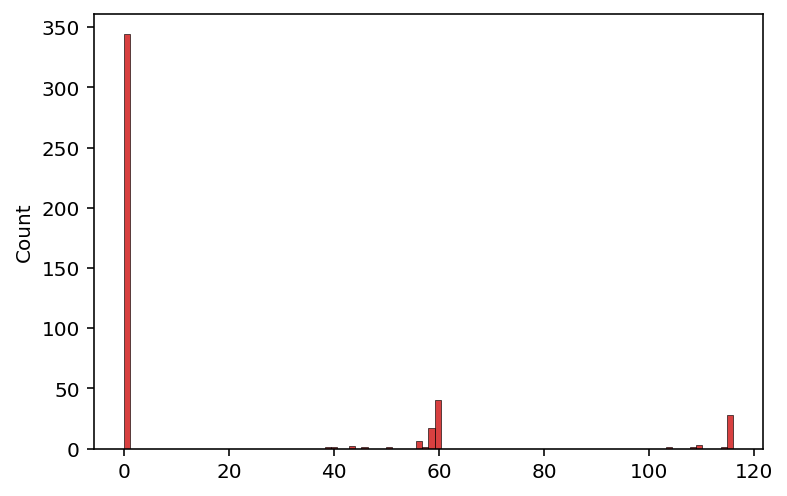

In [139]:
# measurements per object
sns.histplot(df_sat_ver.iloc[:,3:].count(axis=1), bins=100, color=(0.8,0,0))

<AxesSubplot:ylabel='Count'>

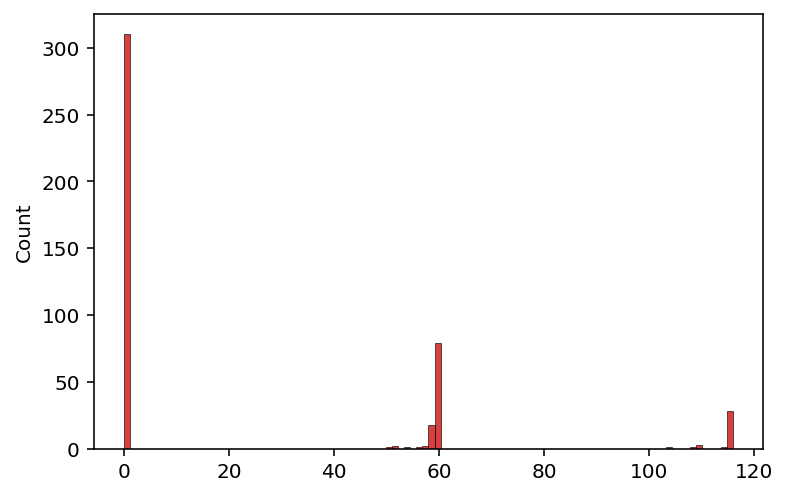

In [140]:
# measurements per object
sns.histplot(df_sat_hor.iloc[:,3:].count(axis=1), bins=100, color=(0.8,0,0))

Text(0.5, 1.0, 'Histogram of Hinterland')

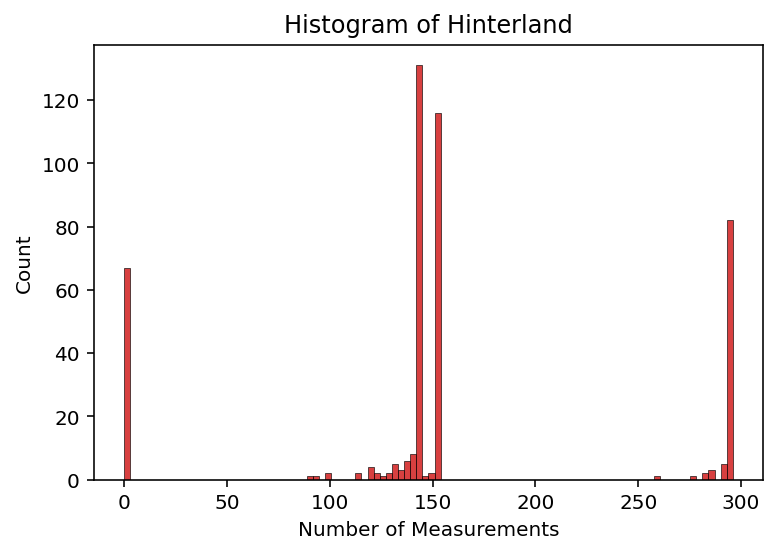

In [141]:
# measurements per object
sns.histplot(df_sat_ach.iloc[:,3:].count(axis=1), bins=100, color=(0.8,0,0))
plt.xlabel('Number of Measurements')
plt.title('Histogram of Hinterland')

Text(0.5, 1.0, 'Histogram of Vertical Direction')

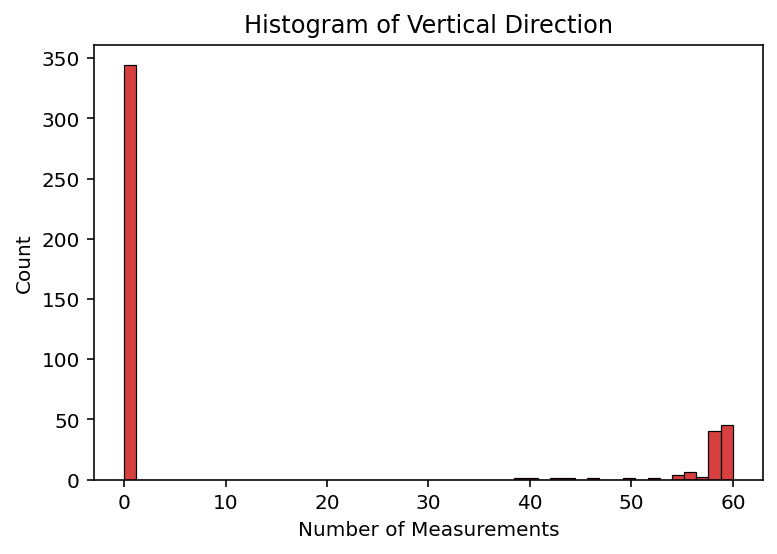

In [142]:
# vertical measurements per object in vertical
ver_ver = df_sat_ver[df_sat_ver.columns[df_sat_ver.columns.str.startswith('v')]]
sns.histplot(ver_ver.count(axis=1), bins=50, color=(0.8,0,0))
plt.xlabel('Number of Measurements')
plt.title('Histogram of Vertical Direction')

Text(0.5, 1.0, 'Histogram of Horizontal Direction')

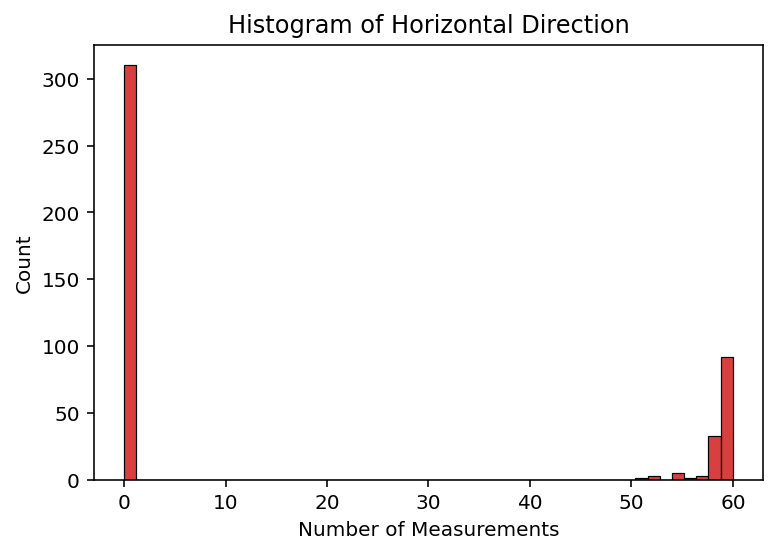

In [143]:
# perpendicular measurements per object in horizontal
perp_hor = df_sat_hor[df_sat_hor.columns[df_sat_hor.columns.str.startswith('p')]]
sns.histplot(perp_hor.count(axis=1), bins=50, color=(0.8,0,0))
plt.xlabel('Number of Measurements')
plt.title('Histogram of Horizontal Direction')

In [144]:
# vertical measurements per object in horizontal and vice versa
perp_ver = df_sat_ver[df_sat_ver.columns[df_sat_ver.columns.str.startswith('p')]]
ver_hor = df_sat_hor[df_sat_hor.columns[df_sat_hor.columns.str.startswith('v')]]

In [145]:
perp_ver_notna = sorted(df_sat_ver.iloc[perp_ver[perp_ver.isna().all(axis=1) == False].index]['id'].values)
ver_hor_notna = sorted(df_sat_hor.iloc[ver_hor[ver_hor.isna().all(axis=1) == False].index]['id'].values)
perp_ver_notna == ver_hor_notna

False

The values for the horizontal direction in the vertical dataframe are for the same objects that have values for the vertical direction in the horizontal dataframe. Usually, only one direction can be measured, because of the angle of the quay wall and satellite. Sometimes both vertical and horizontal can be measured. The values for horizontal direction in the vertical dataframe and vice versa are also present in the other dataframe. Therefore, the vertical timeseries can be removed from the horizontal dataframe, and the horizontal timeseries can be removed from the vertical dataframe.

In [146]:
# min/max value of vertical df
ver_ver.stack().min(), df_sat_ver.iloc[:,3:].stack().max()

(-33.80277, 23.789106)

In [147]:
# min/max value of horizontal df
perp_hor.stack().min(), df_sat_hor.iloc[:,3:].stack().max()

(-45.56105, 40.290653)

In [148]:
# min/max value of achterland df
df_sat_ach.iloc[:,3:].stack().min(), df_sat_ach.iloc[:,3:].stack().max()

(-78.52851, 26.137312)

C:\Users\julia\anaconda3\lib\site-packages\seaborn\categorical.py:82: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


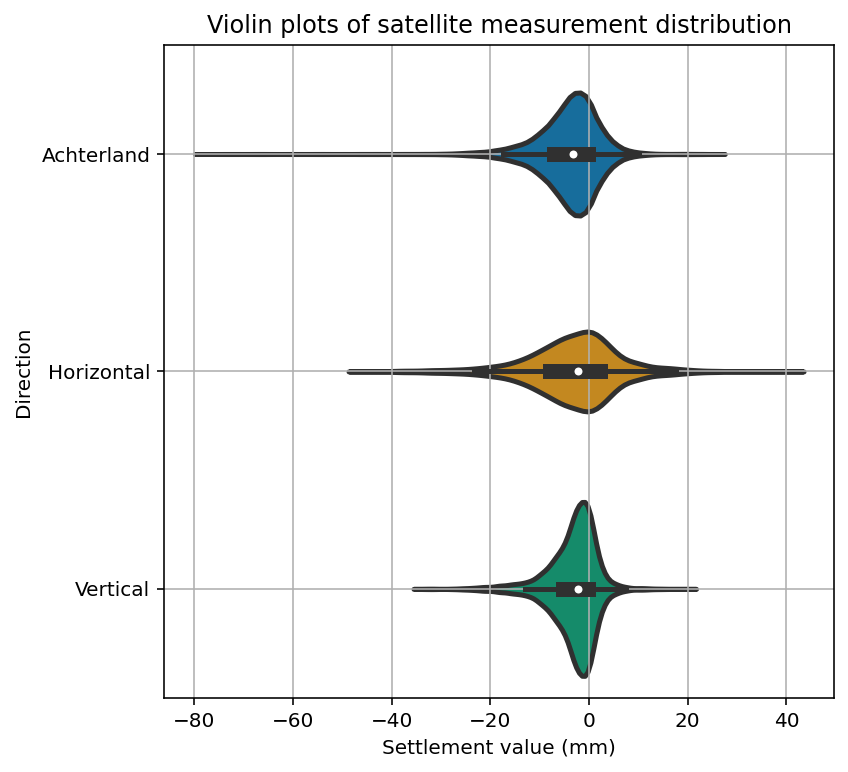

In [149]:
df_violins = pd.DataFrame()

# get all values from dataframes, padding for same length
df_violins['Achterland'] = df_sat_ach.iloc[:,3:].stack().values
df_violins['Horizontal'] = np.pad(np.array(perp_hor.stack().values), (0, len(df_violins)-len(perp_hor.stack().values)), constant_values=(np.nan,))
df_violins['Vertical'] = np.pad(np.array(ver_ver.stack().values), (0, len(df_violins)-len(ver_ver.stack().values)), constant_values=(np.nan,))

fig, ax = plt.subplots(figsize=(6,6))

sns.violinplot(data=df_violins, ax=ax, orient='h', linewidth=2.5, palette='colorblind')
plt.grid()
plt.title('Violin plots of satellite measurement distribution')
plt.ylabel('Direction')
plt.xlabel('Settlement value (mm)')
plt.show()

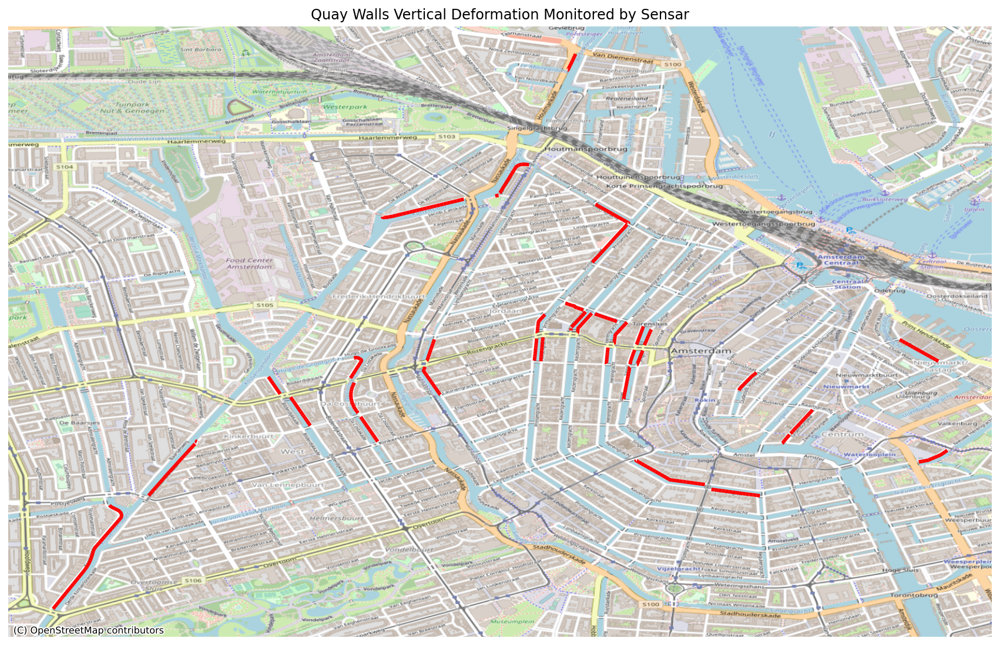

In [150]:
gdf_ver = gpd.GeoDataFrame(df_sat_ver, geometry=gpd.GeoSeries.from_wkt(df_sat_ver['WKT']))
gdf_ver.crs = "EPSG:28992"
gdf_ver = gdf_ver.to_crs("EPSG: 4326")

fig, ax = plt.subplots(figsize=(15,15))

# plot datapoints
gdf_ver.plot(ax=ax, color='red', linewidth=3)

# add background of city of Amsterdam
cx.add_basemap(ax=ax, source=cx.providers.OpenStreetMap.Mapnik, crs=gdf_ver.crs)

ax.axis('off')
plt.title('Quay Walls Vertical Deformation Monitored by Sensar')
plt.show()

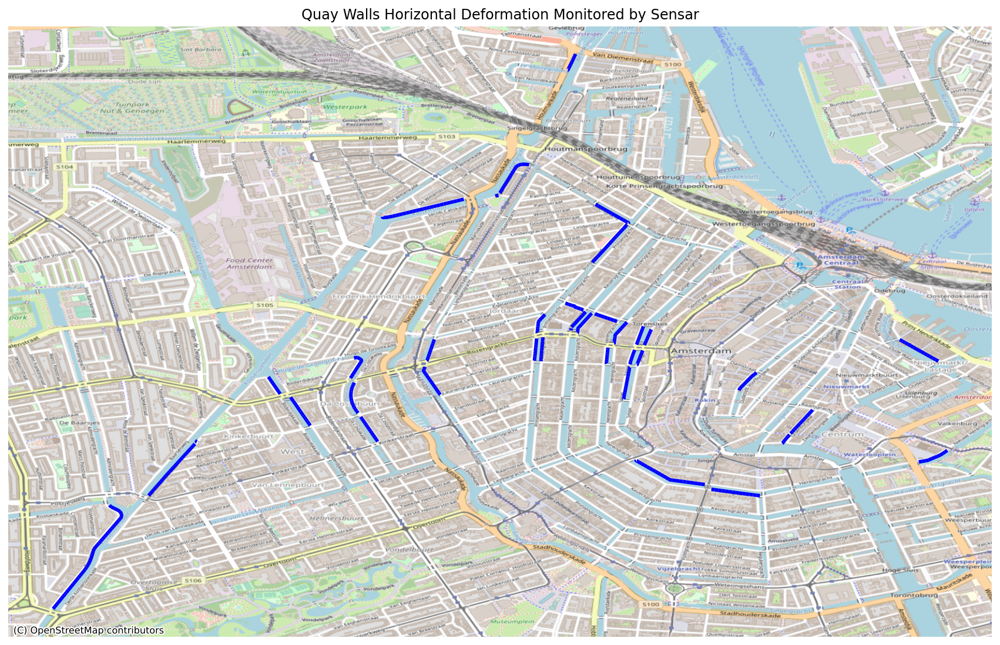

In [151]:
gdf_hor = gpd.GeoDataFrame(df_sat_hor, geometry=gpd.GeoSeries.from_wkt(df_sat_hor['WKT']))
gdf_hor.crs = "EPSG:28992"
gdf_hor = gdf_hor.to_crs("EPSG: 4326")

fig, ax = plt.subplots(figsize=(15,15))

# plot datapoints
gdf_hor.plot(ax=ax, color='blue', linewidth=3)

# add background of city of Amsterdam
cx.add_basemap(ax=ax, source=cx.providers.OpenStreetMap.Mapnik, crs=gdf_hor.crs)

ax.axis('off')
plt.title('Quay Walls Horizontal Deformation Monitored by Sensar')
plt.show()

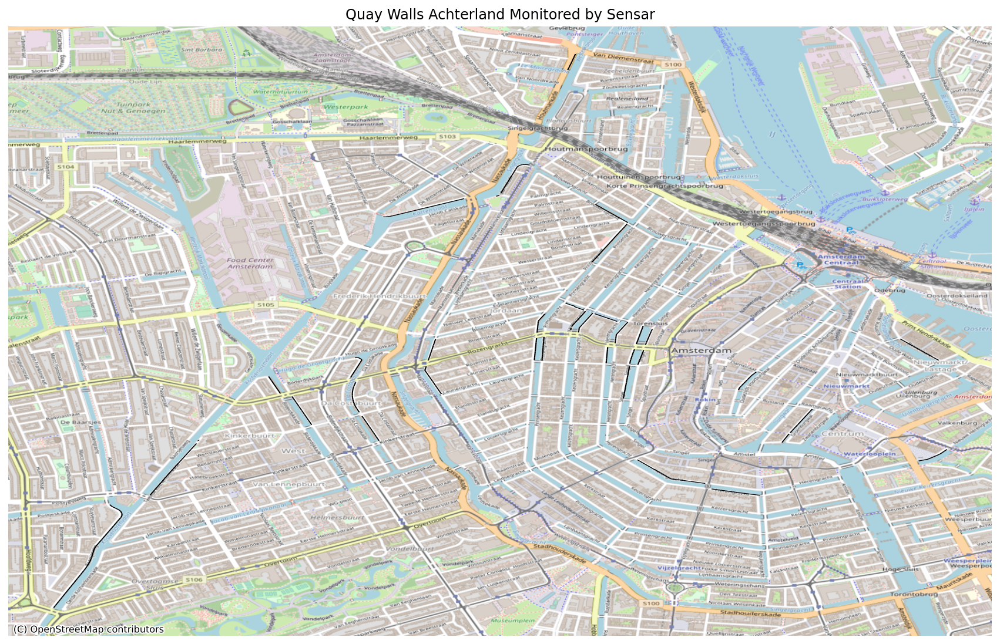

In [152]:
gdf_ach = gpd.GeoDataFrame(df_sat_ach, geometry=gpd.GeoSeries.from_wkt(df_sat_ach['WKT']))
gdf_ach.crs = "EPSG:28992"
gdf_ach = gdf_ach.to_crs("EPSG: 4326")

fig, ax = plt.subplots(figsize=(15,15))

# plot datapoints
gdf_ach.plot(ax=ax, color='black', linewidth=5)

# add background of city of Amsterdam
cx.add_basemap(ax=ax, source=cx.providers.OpenStreetMap.Mapnik, crs=gdf_ach.crs)

ax.axis('off')
plt.title('Quay Walls Achterland Monitored by Sensar')
plt.show()

In [153]:
def interpolate_df(df, angle='v'):
    """
    Function to get consistent timesteps. 
    """
    
    # format dataframe as columns [object id, time series]
    df = df[['objectnumm'] + df.columns[df.columns.str.startswith(angle)].tolist()]
    df = df.set_index('objectnumm')
    df.index.name = None
    
    # column names to datetime
    df.columns = pd.to_datetime(df.columns.str[2:])
    
    # get all dates present in df
    test_dates = pd.date_range(start=df.columns[0], end=df.columns[-1] + pd.offsets.MonthEnd(), freq='M')-pd.offsets.MonthBegin(1)
    df_dates = pd.DataFrame(index=df.index)
    
    # iterate over months
    for month in test_dates:
                        
        # find columns of that month
        columns = [col for col in df.columns if pd.to_datetime(col).month == month.month \
                   and pd.to_datetime(col).year == month.year]
        
        # take mean value for multiple measurements of that month
        df_dates[month] = df[columns].mean(axis=1)
        
    # fill first column with zero's if no measurement
    df_dates.iloc[:,0] = df_dates.iloc[:,0].fillna(0)
    
    # interpolate untill the last measurement
    df_dates = df_dates.interpolate(axis=1, limit_area='inside')

    # take mean value if multiple timeseries per object
    df_dates = df_dates.groupby(df_dates.index).mean()
    
    return df_dates

In [154]:
cpt = pd.read_csv('../Data/CPT_train_v3.csv', index_col=0)
len(cpt.index.unique())

30

In [155]:
df_ver = interpolate_df(df_sat_ver)
df_ver = df_ver[df_ver.index.isin(cpt.index.unique())]

In [156]:
df_ver.loc['KZG0302']

2017-01-01    0.000000
2017-02-01    2.894548
2017-03-01    3.020910
2017-04-01    3.583337
2017-05-01    4.145764
                ...   
2021-09-01         NaN
2021-10-01         NaN
2021-11-01         NaN
2021-12-01         NaN
2022-01-01         NaN
Name: KZG0302, Length: 61, dtype: float64

In [157]:
# set missing time series to valid time serie of same wall
# df_ver.loc['GRW0201'] = df_ver.loc['GRW0101']
df_ver.loc['DCG0302'] = df_ver.loc['DCG0202']   # .mean().values
df_ver.loc['LYG0501'] = df_ver.loc['LYG0601']   # .mean().values
df_ver.loc['PRG0401'] = df_ver.loc['PRG0301']   # .mean().values
df_ver.loc['PRG0402'] = df_ver.loc['PRG0301']   # .mean().values
df_ver.loc['SIN0502'] = df_ver.loc['SIN0501']   # .mean().values
df_ver.loc['SIN0601'] = df_ver.loc['SIN0501']   # .mean().values
df_ver.loc['SIN0602'] = df_ver.loc['SIN0501']   # .mean().values
df_ver.loc['SIN0701'] = df_ver.loc['SIN0501']   # .mean().values

# set missing values at the end of a time serie to the last valid value
df_ver.loc['KZG0302'] = df_ver.loc['KZG0302'].fillna(method='ffill').values
df_ver.loc['HEG0401'] = df_ver.loc['KZG0302'].fillna(method='ffill').values

#.iloc[1]

df_ver['index'] = df_ver.index
df_ver = df_ver.drop_duplicates()
df_ver = df_ver.drop('index', axis=1)
df_ver = df_ver.dropna()

In [158]:
len(df_ver.index.unique())

30

In [159]:
df_hor = interpolate_df(df_sat_hor, angle='p')
df_hor = df_hor[df_hor.index.isin(cpt.index)]

In [160]:
# set missing time series to valid time serie of same wall
df_hor.loc['HEG0901'] = df_hor.loc['HEG0802']   # .mean().values

# set missing time series to valid time serie of the vertical direction
df_hor.loc['LLG0102'] = df_ver.loc['LLG0102']   # .mean().values
df_hor.loc['LLG0202'] = df_ver.loc['LLG0202']   # .mean().values
# df_hor.loc['KAS0101'] = df_ver.loc['KAS0101']

df_hor['index'] = df_hor.index

df_hor = df_hor.drop_duplicates()

df_hor = df_hor.drop('index', axis=1)

In [161]:
df_hor = df_hor.dropna()

In [162]:
len(df_hor.index.unique())

30

In [163]:
df_ach = interpolate_df(df_sat_ach)
df_ach = df_ach[df_ach.index.isin(cpt.index)]

In [164]:
df_ach = df_ach.dropna()

In [165]:
df_ver.iloc[:,1:].isna().any(axis=1), df_hor.iloc[:,1:].isna().any(axis=1), df_ach.iloc[:,1:].isna().any(axis=1)

(BDG0101    False
 BDG0202    False
 DCG0101    False
 DCG0202    False
 DCG0302    False
 GRW0101    False
 HEG0302    False
 HEG0401    False
 HEG0802    False
 HEG0901    False
 KVV0602    False
 KVV0702    False
 KZG0301    False
 KZG0302    False
 LLG0102    False
 LLG0202    False
 LYG0501    False
 LYG0601    False
 NHG0201    False
 OVW0601    False
 PRG0301    False
 PRG0401    False
 PRG0402    False
 SIN0501    False
 SIN0502    False
 SIN0601    False
 SIN0602    False
 SIN0701    False
 WEG0201    False
 WKN0101    False
 dtype: bool,
 BDG0101    False
 BDG0202    False
 DCG0101    False
 DCG0202    False
 DCG0302    False
 GRW0101    False
 HEG0302    False
 HEG0401    False
 HEG0802    False
 HEG0901    False
 KVV0602    False
 KVV0702    False
 KZG0301    False
 KZG0302    False
 LLG0102    False
 LLG0202    False
 LYG0501    False
 LYG0601    False
 NHG0201    False
 OVW0601    False
 PRG0301    False
 PRG0401    False
 PRG0402    False
 SIN0501    False
 SIN0502    Fa

In [166]:
# get only months overlapping with the tacheometry data
df_ver = df_ver.iloc[:,22:-1]
df_hor = df_hor.iloc[:, 22:-1]
df_ach = df_ach.iloc[:, 22:-1]

In [170]:
df_ver.to_csv('../Data/SatVer.csv', index = True)
df_hor.to_csv('../Data/SatHor.csv', index = True)
df_ach.to_csv('../Data/SatAch.csv', index = True)